# imports

---



---



In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage.transform import resize
from skimage import data
from scipy.ndimage import gaussian_filter
import IPython.display as ipyd
import tensorflow as tf
import urllib
import zipfile
from scipy.io import wavfile
import matplotlib.animation as animation

from tensorflow.python.platform import gfile
from skimage.transform import resize as imresize
import tensorflow.compat.v1 as tf_compat_v1

In [3]:
%matplotlib inline
plt.style.use('ggplot')

# util methods + loading model

---

Util methods derived from VAE-GAN Paper cited in the model architecture.

---



In [5]:
def imcrop_tosquare(img):
    size = np.min(img.shape[:2])
    extra = img.shape[:2] - size
    crop = img
    for i in np.flatnonzero(extra):
        crop = np.take(crop, extra[i] // 2 + np.r_[:size], axis=i)
    return crop

In [6]:
def download(path):
    import os
    from six.moves import urllib

    fname = path.split('/')[-1]
    if os.path.exists(fname):
        return fname

    print('Downloading ' + path)

    def progress(count, block_size, total_size):
        if count % 20 == 0:
            print('Downloaded %02.02f/%02.02f MB' % (
                count * block_size / 1024.0 / 1024.0,
                total_size / 1024.0 / 1024.0), end='\r')

    filepath, _ = urllib.request.urlretrieve(
        path, filename=fname, reporthook=progress)
    return filepath

In [7]:
def montage(images, saveto='montage.png'):
    if isinstance(images, list):
        images = np.array(images)
    img_h = images.shape[1]
    img_w = images.shape[2]
    n_plots = int(np.ceil(np.sqrt(images.shape[0])))
    if len(images.shape) == 4 and images.shape[3] == 3:
        m = np.ones(
            (images.shape[1] * n_plots + n_plots + 1,
             images.shape[2] * n_plots + n_plots + 1, 3)) * 0.5
    else:
        m = np.ones(
            (images.shape[1] * n_plots + n_plots + 1,
             images.shape[2] * n_plots + n_plots + 1)) * 0.5
    for i in range(n_plots):
        for j in range(n_plots):
            this_filter = i * n_plots + j
            if this_filter < images.shape[0]:
                this_img = images[this_filter]
                m[1 + i + i * img_h:1 + i + (i + 1) * img_h,
                  1 + j + j * img_w:1 + j + (j + 1) * img_w] = this_img
    plt.imsave(arr=m, fname=saveto)
    return m


def get_celeb_files(dst='img_align_celeba', max_images=100):
    # Create a directory
    if not os.path.exists(dst):
        os.mkdir(dst)

    # Now perform the following 100 times:
    for img_i in range(1, max_images + 1):

        # create a string using the current loop counter
        f = '000%03d.jpg' % img_i

        if not os.path.exists(os.path.join(dst, f)):

            # and get the url with that string appended the end
            url = 'https://s3.amazonaws.com/cadl/celeb-align/' + f

            # We'll print this out to the console so we can see how far we've gone
            print(url, end='\r')

            # And now download the url to a location inside our new directory
            urllib.request.urlretrieve(url, os.path.join(dst, f))

    files = [os.path.join(dst, file_i)
             for file_i in os.listdir(dst)
             if '.jpg' in file_i][:max_images]
    return files


def get_celeb_imgs(max_images=100):
    return [plt.imread(f_i) for f_i in get_celeb_files(max_images=max_images)]




In [8]:
def build_gif(imgs, interval=0.1, dpi=72,
              save_gif=True, saveto='animation.gif',
              show_gif=False, cmap=None):

    imgs = np.asarray(imgs)
    h, w, *c = imgs[0].shape
    fig, ax = plt.subplots(figsize=(np.round(w / dpi), np.round(h / dpi)))
    fig.subplots_adjust(bottom=0)
    fig.subplots_adjust(top=1)
    fig.subplots_adjust(right=1)
    fig.subplots_adjust(left=0)
    ax.set_axis_off()

    if cmap is not None:
        axs = list(map(lambda x: [
            ax.imshow(x, cmap=cmap)], imgs))
    else:
        axs = list(map(lambda x: [
            ax.imshow(x)], imgs))

    ani = animation.ArtistAnimation(
        fig, axs, interval=interval*1000, repeat_delay=0, blit=True)

    if save_gif:
        ani.save(saveto, writer='imagemagick', dpi=dpi)

    if show_gif:
        plt.show()

    return ani

In [11]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

def celeb_vaegan_download():
    """Download a pretrained celeb vae/gan network."""
    # Load the model and labels
    model = download('https://s3.amazonaws.com/cadl/models/celeb.vaegan.tfmodel')
    labels = download('https://s3.amazonaws.com/cadl/celeb-align/list_attr_celeba.txt')
    return model, labels


def get_celeb_vaegan_model():
    """Get a pretrained model.

    -------
    net : dict
        {
            'graph_def': tf.GraphDef
                The graph definition
            'labels': list
                List of different possible attributes from celeb
            'attributes': np.ndarray
                One hot encoding of the attributes per image
                [n_els x n_labels]
            'preprocess': function
                Preprocess function
        }
    """
    # Download the trained net
    model, labels = celeb_vaegan_download()

    # Parse the ids and synsets
    txt = open(labels).readlines()
    n_els = int(txt[0].strip())
    labels = txt[1].strip().split()
    n_labels = len(labels)
    attributes = np.zeros((n_els, n_labels), dtype=bool)
    for i, txt_i in enumerate(txt[2:]):
        attributes[i] = (np.array(txt_i.strip().split()[1:]).astype(int) > 0)

    # Load the saved graph

    with gfile.GFile(model, 'rb') as f:
        graph_def = tf.compat.v1.GraphDef()
        # graph_def = tf.GraphDef()

        try:
            graph_def.ParseFromString(f.read())
        except:
            print('')
    net = {
        'graph_def': graph_def,
        'labels': labels,
        'attributes': attributes,
        'preprocess': preprocess,
    }
    return net


def preprocess(img, crop_factor=0.8):
    """Replicate the preprocessing we did on the VAE/GAN.
    This model used a crop_factor of 0.8 and crop size of [100, 100, 3].
    """
    crop = np.min(img.shape[:2])
    r = (img.shape[0] - crop) // 2
    c = (img.shape[1] - crop) // 2
    cropped = img[r: r + crop, c: c + crop]
    r, c, *d = cropped.shape
    if crop_factor < 1.0:
        amt = (1 - crop_factor) / 2
        h, w = int(c * amt), int(r * amt)
        cropped = cropped[h:-h, w:-w]
    rsz = imresize(cropped, (100, 100), preserve_range=False)
    return rsz


In [12]:
net = get_celeb_vaegan_model()


In [13]:
!unzip "/content/drive/MyDrive/Rice University/2023-2024/ELEC 576: Intro to Deep Learning/Final Project/img_align_celeba.zip"

Streaming output truncated to the last 5000 lines.
 extracting: img_align_celeba/197600.jpg  
 extracting: img_align_celeba/197601.jpg  
 extracting: img_align_celeba/197602.jpg  
 extracting: img_align_celeba/197603.jpg  
 extracting: img_align_celeba/197604.jpg  
 extracting: img_align_celeba/197605.jpg  
 extracting: img_align_celeba/197606.jpg  
 extracting: img_align_celeba/197607.jpg  
 extracting: img_align_celeba/197608.jpg  
 extracting: img_align_celeba/197609.jpg  
 extracting: img_align_celeba/197610.jpg  
 extracting: img_align_celeba/197611.jpg  
 extracting: img_align_celeba/197612.jpg  
 extracting: img_align_celeba/197613.jpg  
 extracting: img_align_celeba/197614.jpg  
 extracting: img_align_celeba/197615.jpg  
 extracting: img_align_celeba/197616.jpg  
 extracting: img_align_celeba/197617.jpg  
 extracting: img_align_celeba/197618.jpg  
 extracting: img_align_celeba/197619.jpg  
 extracting: img_align_celeba/197620.jpg  
 extracting: img_align_celeba/197621.jpg  
 ex

In [14]:
def CELEB(path='./img_align_celeba/'):
    if not os.path.exists(path):
        print('Could not find celeb dataset under {}.'.format(path))
        print('files')
        return None
    else:
        fs = [os.path.join(path, f)
              for f in os.listdir(path) if f.endswith('.jpg')]
        if len(fs) < 202598:
            print('less files')
        return fs

In [15]:
files = CELEB()

celeb_files = files.copy()

# generating feature vectors

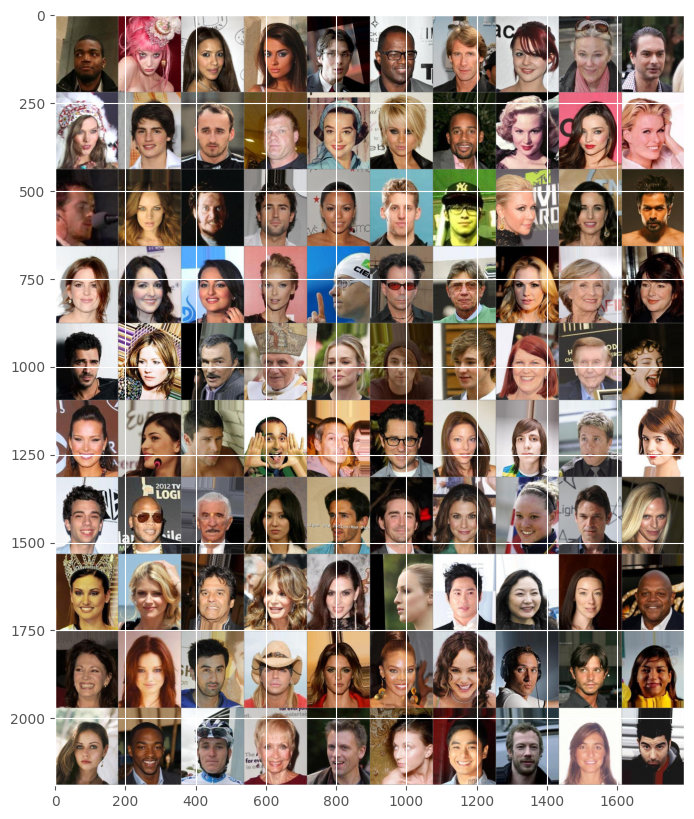

In [16]:
label='Eyeglasses'
has_label=True
n_imgs=100
label_i = net['labels'].index(label)
label_idxs = np.where(net['attributes'][:, label_i] == has_label)[0]
label_idxs = label_idxs[:n_imgs]
vgg_imgs = [plt.imread(files[img_i])/255.0
        for img_i in label_idxs]


m = montage(vgg_imgs, 'test_eyeglasses.png')
plt.figure(figsize=(10, 10))
plt.imshow(m)

# eyeglasses

In [17]:
!cd "/content/drive/MyDrive/Rice University/2023-2024/ELEC 576: Intro to Deep Learning/Final Project"

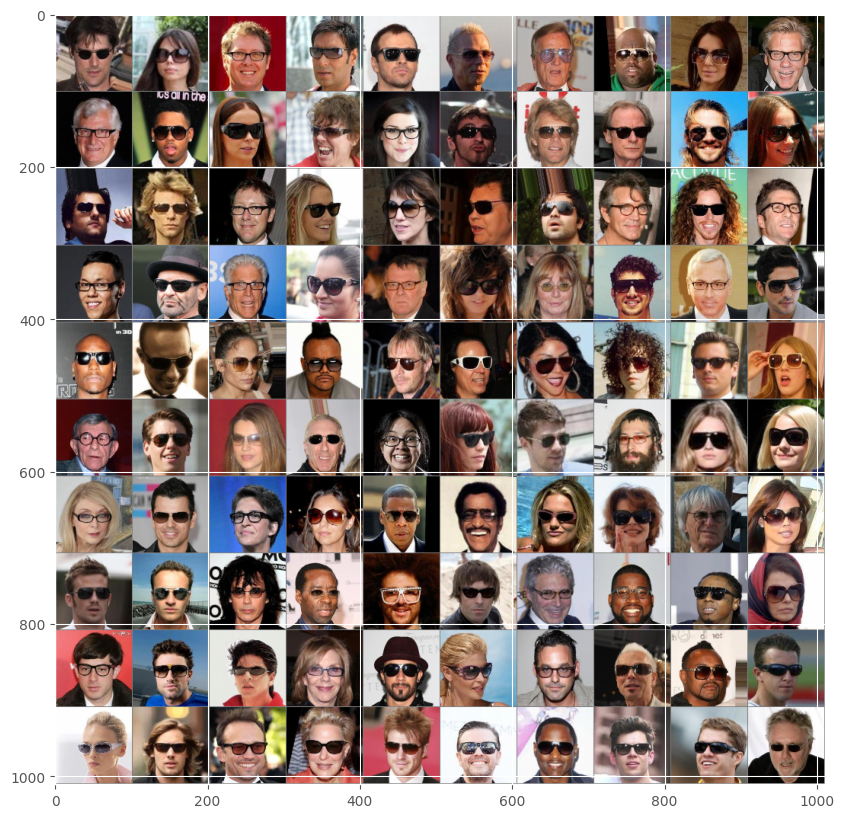

In [18]:

dirname = '/content/drive/MyDrive/Rice University/2023-2024/ELEC 576: Intro to Deep Learning/Final Project/FacesWithGlasses'
files = [os.path.join(dirname, fname)
             for fname in os.listdir(dirname)]

glasses_imgs = [plt.imread(files[img_i])
        for img_i in range(len(files))]

glasses_imgs = [imcrop_tosquare(img_i) for img_i in glasses_imgs]

glasses_imgs = [resize(img_i, (100, 100)) for img_i in glasses_imgs]

m = montage(glasses_imgs, 'FacesWithGlasses.png')
plt.figure(figsize=(10, 10))
plt.imshow(m)

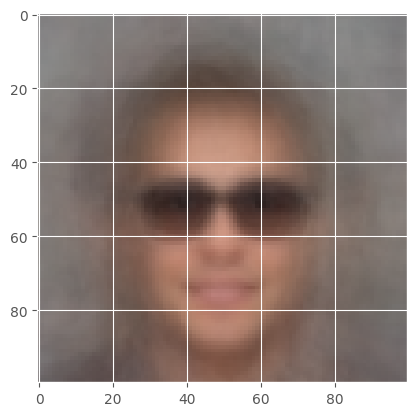

In [19]:
plt.imshow(np.mean(glasses_imgs, 0))


In [20]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

In [21]:
#tf.reset_default_graph()
sess = tf.Session()
g = tf.get_default_graph()
tf.import_graph_def(net['graph_def'], name='net', input_map={
    'encoder/variational/random_normal:0': np.zeros(512, dtype=np.float32)})

In [22]:
X = g.get_tensor_by_name('net/x:0')
Z = g.get_tensor_by_name('net/encoder/variational/z:0')
G = g.get_tensor_by_name('net/generator/x_tilde:0')

In [23]:
def get_features_for(feature_img_directory='./FacesWithGlasses/', n_imgs=100):

    files = [os.path.join(feature_img_directory, fname)
             for fname in os.listdir(feature_img_directory)]

    files = files[:n_imgs]

    feature_imgs = [plt.imread(files[img_i])
        for img_i in range(len(files))]

    feature_imgs = [imcrop_tosquare(img_i) for img_i in feature_imgs]

    feature_imgs = [resize(img_i, (100, 100)) for img_i in feature_imgs]

    preprocessed = np.array([preprocess(img_i) for img_i in feature_imgs])
    zs = sess.run(Z, feed_dict={X: preprocessed})

    return np.mean(zs, 0)

In [24]:
dirname = '/content/drive/MyDrive/Rice University/2023-2024/ELEC 576: Intro to Deep Learning/Final Project/FacesWithGlasses'

z1 = get_features_for(feature_img_directory=dirname)


(1, 512)


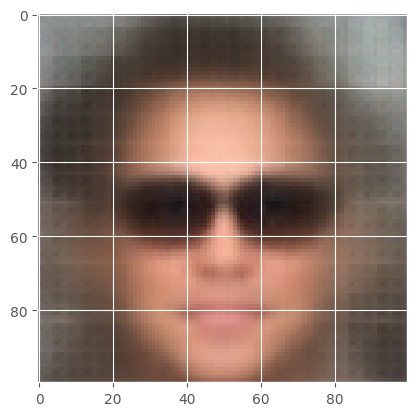

In [25]:
print(z1[np.newaxis].shape)
feature_generated = sess.run(G, feed_dict={Z: z1[np.newaxis]})
plt.imshow(feature_generated[0] / feature_generated.max())

(1, 512)


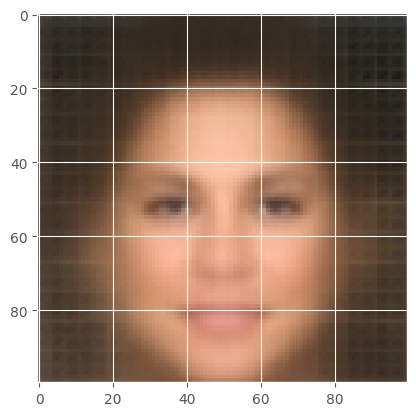

In [26]:
# Mean of faces with no glasses
z2 = get_features_for(feature_img_directory='./img_align_celeba/', n_imgs=100)
print(z2[np.newaxis].shape)
feature_generated = sess.run(G, feed_dict={Z: z2[np.newaxis]})
plt.imshow(feature_generated[0] / feature_generated.max())

In [27]:
glass_vector = z1 - z2


(1, 512)


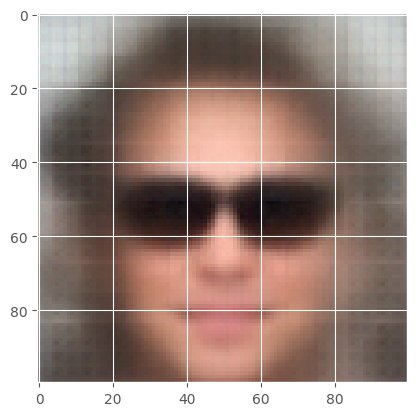

In [28]:
print(glass_vector[np.newaxis].shape)
generated_glass_vector = sess.run(G, feed_dict={Z: glass_vector[np.newaxis]})
plt.imshow(generated_glass_vector[0] / generated_glass_vector.max())

In [29]:
from scipy.ndimage import gaussian_filter

idxs = np.random.permutation(range(len(celeb_files)))
imgs = [plt.imread(celeb_files[idx_i]) for idx_i in idxs[:100]]
blurred = []
for img_i in imgs:
    img_copy = np.zeros_like(img_i)
    for ch_i in range(3):
        img_copy[..., ch_i] = gaussian_filter(img_i[..., ch_i], sigma=3.0)
    blurred.append(img_copy)
imgs_p = np.array([preprocess(img_i) for img_i in imgs])
blur_p = np.array([preprocess(img_i) for img_i in blurred])

noblur = sess.run(Z, feed_dict={X: imgs_p})
blur = sess.run(Z, feed_dict={X: blur_p})

synthetic_unblur_vector = np.mean(noblur - blur, 0)

In [30]:
# Let's randomly choose a set of 100 faces on the Celeb dataset and try apply the effect of the glass_vector on.


idxs = np.random.permutation(range(len(celeb_files)))
imgs = [plt.imread(celeb_files[idx_i]) for idx_i in idxs[:100]]

imgs_p = np.array([preprocess(img_i) for img_i in imgs])

print("size celeb_files : ", len(celeb_files))

z = sess.run(Z, feed_dict={X: imgs_p})

n_imgs = 5
amt = np.linspace(0, 1, n_imgs)
imgs = []
g_lst = []
for amt_i in amt:
    zs = z + synthetic_unblur_vector * amt_i + amt_i * glass_vector + amt_i * glass_vector
    g = sess.run(G, feed_dict={Z: zs})
    g_lst.append(np.clip(g, 0, 1))
    m = montage(np.clip(g, 0, 1))
    imgs.append(m)



size celeb_files :  202599


Text(0.5, 1.0, 'Generated Image')

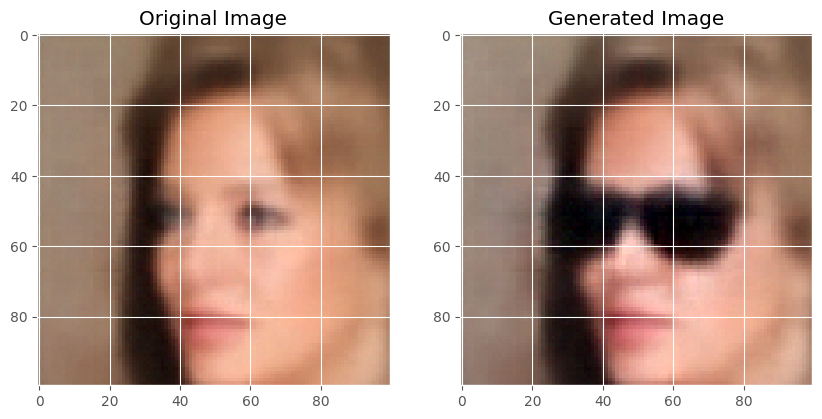

In [33]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(g_lst[1][0]), axs[0].grid('off')
axs[0].set_title('Original Image')
axs[1].imshow(g_lst[len(g_lst)-1][0], axs[1].grid('off'))
axs[1].set_title('Generated Image')

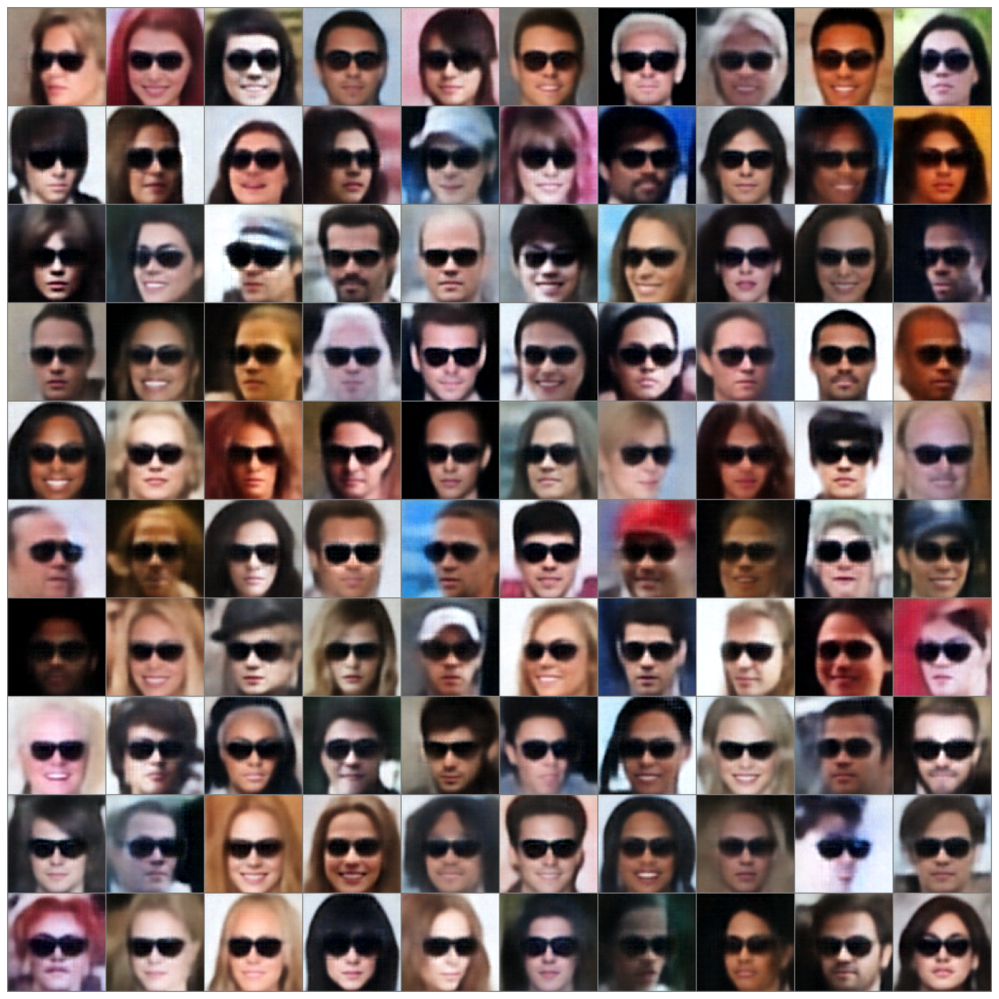

In [34]:
build_gif(imgs=imgs, saveto='final_project_glass.gif')

# hats

In [37]:
files = CELEB()

celeb_files = files.copy()

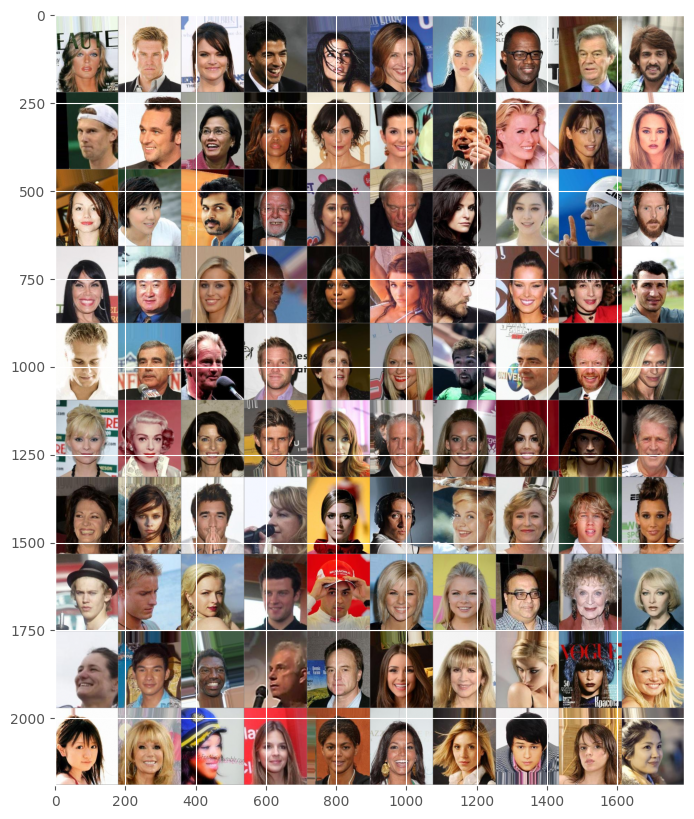

In [38]:
# Change the label to test different attributes
label='Wearing_Hat'
has_label=True
n_imgs=100
label_i = net['labels'].index(label)
label_idxs = np.where(net['attributes'][:, label_i] == has_label)[0]
label_idxs = label_idxs[:n_imgs] #Take the first n_imgs indices that have label
vgg_imgs = [plt.imread(files[img_i])/255.0
        for img_i in label_idxs]

# indices with true eyeglasses : 8, 34,
# indices with true hats : 6, 18, 23,
m = montage(vgg_imgs, 'test_bald.png')
plt.figure(figsize=(10, 10))
plt.imshow(m)

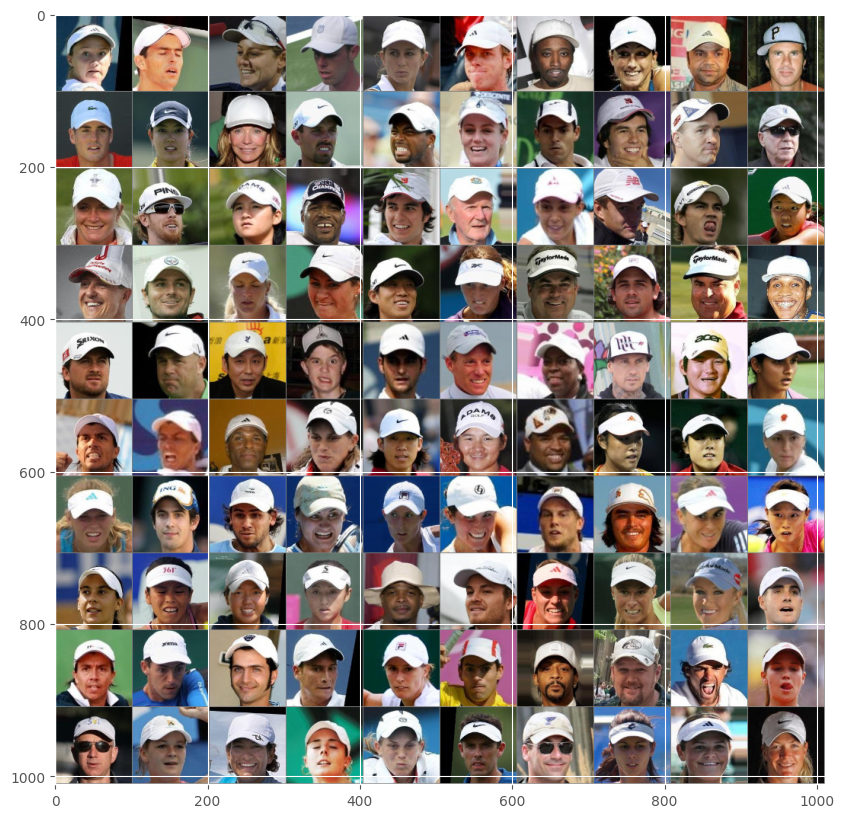

In [41]:
### The hats dataset
# dirname = 'FacesWithGlasses/'
dirname = '/content/drive/MyDrive/Rice University/2023-2024/ELEC 576: Intro to Deep Learning/Final Project/FacesWithHats'
#dirname = './glasses/'
files = [os.path.join(dirname, fname)
             for fname in os.listdir(dirname)]

hat_imgs = [plt.imread(files[img_i])
        for img_i in range(len(files))]

# Crop every image to a square
hat_imgs = [imcrop_tosquare(img_i) for img_i in hat_imgs]

# Then resize the square image to 100 x 100 pixels
hat_imgs = [resize(img_i, (100, 100)) for img_i in hat_imgs]

m = montage(hat_imgs, 'FacesWithGlasses.png')
plt.figure(figsize=(10, 10))
plt.imshow(m)

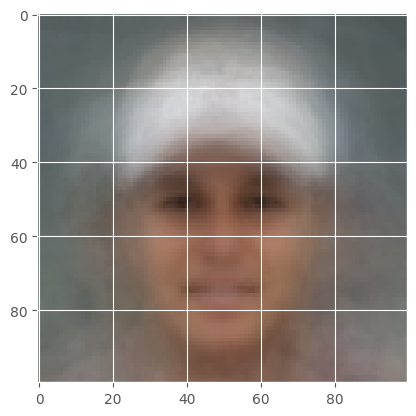

In [42]:
plt.imshow(np.mean(hat_imgs, 0))


In [43]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

In [44]:
#tf.reset_default_graph()
sess = tf.Session()
g = tf.get_default_graph()
tf.import_graph_def(net['graph_def'], name='net', input_map={
    'encoder/variational/random_normal:0': np.zeros(512, dtype=np.float32)})

In [45]:
X = g.get_tensor_by_name('net/x:0')
Z = g.get_tensor_by_name('net/encoder/variational/z:0')
G = g.get_tensor_by_name('net/generator/x_tilde:0')

In [46]:
def get_features_for(feature_img_directory='./FacesWithHats/', n_imgs=100):

    files = [os.path.join(feature_img_directory, fname)
             for fname in os.listdir(feature_img_directory)]

    files = files[:n_imgs]

    feature_imgs = [plt.imread(files[img_i])
        for img_i in range(len(files))]

    # Crop every image to a square
    feature_imgs = [imcrop_tosquare(img_i) for img_i in feature_imgs]

    # Then resize the square image to 100 x 100 pixels
    feature_imgs = [resize(img_i, (100, 100)) for img_i in feature_imgs]

    preprocessed = np.array([preprocess(img_i) for img_i in feature_imgs])
    zs = sess.run(Z, feed_dict={X: preprocessed})

    return np.mean(zs, 0)

In [48]:
dirname = '/content/drive/MyDrive/Rice University/2023-2024/ELEC 576: Intro to Deep Learning/Final Project/FacesWithHats'
z1 = get_features_for(feature_img_directory=dirname)


(1, 512)


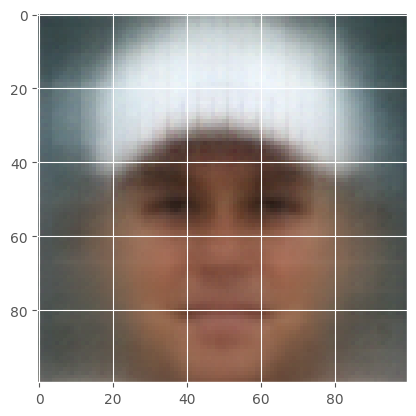

In [49]:
print(z1[np.newaxis].shape)
feature_generated = sess.run(G, feed_dict={Z: z1[np.newaxis]})
plt.imshow(feature_generated[0] / feature_generated.max())

(1, 512)


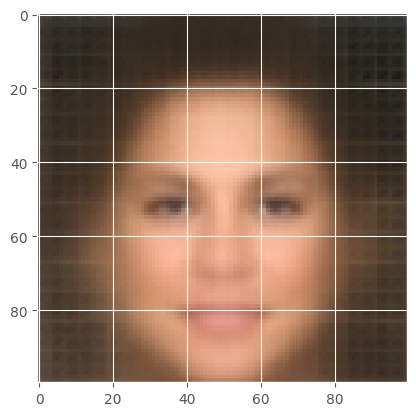

In [50]:
# Mean of faces with no glasses
z2 = get_features_for(feature_img_directory='./img_align_celeba/', n_imgs=100)
print(z2[np.newaxis].shape)
feature_generated = sess.run(G, feed_dict={Z: z2[np.newaxis]})
plt.imshow(feature_generated[0] / feature_generated.max())

In [51]:
glass_vector = z1 - z2


(1, 512)


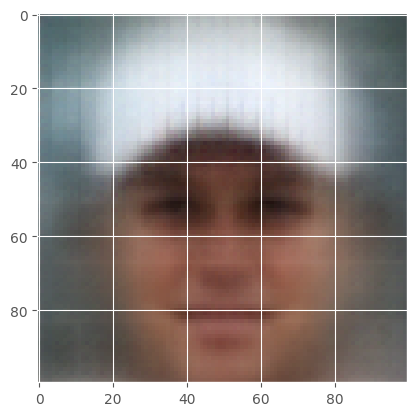

In [52]:
print(glass_vector[np.newaxis].shape)
generated_glass_vector = sess.run(G, feed_dict={Z: glass_vector[np.newaxis]})
plt.imshow(generated_glass_vector[0] / generated_glass_vector.max())

In [53]:
from scipy.ndimage import gaussian_filter

idxs = np.random.permutation(range(len(celeb_files)))
imgs = [plt.imread(celeb_files[idx_i]) for idx_i in idxs[:100]]
blurred = []
for img_i in imgs:
    img_copy = np.zeros_like(img_i)
    for ch_i in range(3):
        img_copy[..., ch_i] = gaussian_filter(img_i[..., ch_i], sigma=3.0)
    blurred.append(img_copy)
imgs_p = np.array([preprocess(img_i) for img_i in imgs])
blur_p = np.array([preprocess(img_i) for img_i in blurred])

noblur = sess.run(Z, feed_dict={X: imgs_p})
blur = sess.run(Z, feed_dict={X: blur_p})

synthetic_unblur_vector = np.mean(noblur - blur, 0)

# Let's randomly choose a set of 100 faces on the Celeb dataset and try apply the effect of the glass_vector on.


idxs = np.random.permutation(range(len(celeb_files)))
imgs = [plt.imread(celeb_files[idx_i]) for idx_i in idxs[:100]]

imgs_p = np.array([preprocess(img_i) for img_i in imgs])

print("size celeb_files : ", len(celeb_files))

z = sess.run(Z, feed_dict={X: imgs_p})

n_imgs = 5
amt = np.linspace(0, 1, n_imgs)
imgs = []
for amt_i in amt:
    zs = z + synthetic_unblur_vector * amt_i + amt_i * glass_vector + amt_i * glass_vector
    g = sess.run(G, feed_dict={Z: zs})
    m = montage(np.clip(g, 0, 1))
    imgs.append(m)



size celeb_files :  202599


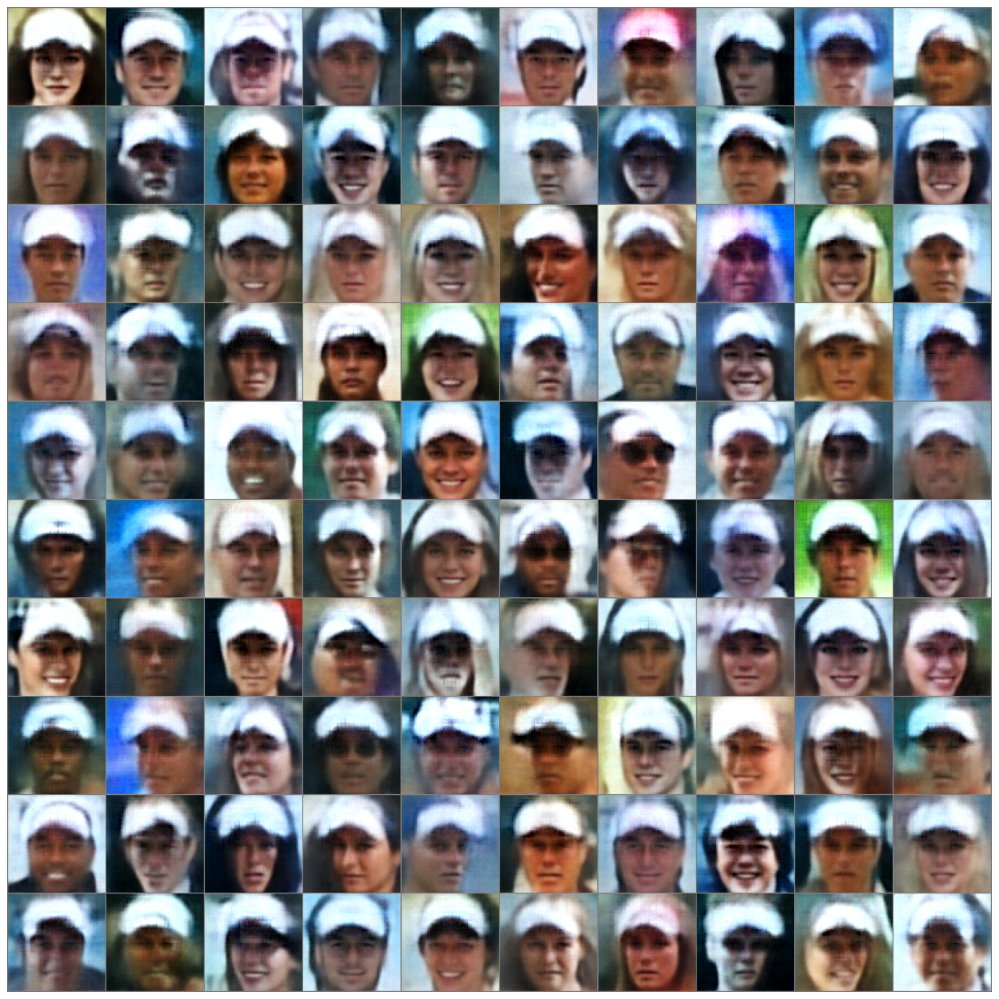

In [54]:
build_gif(imgs=imgs, saveto='final_project_hats.gif')

# bangs

In [77]:
files = CELEB()

celeb_files = files.copy()

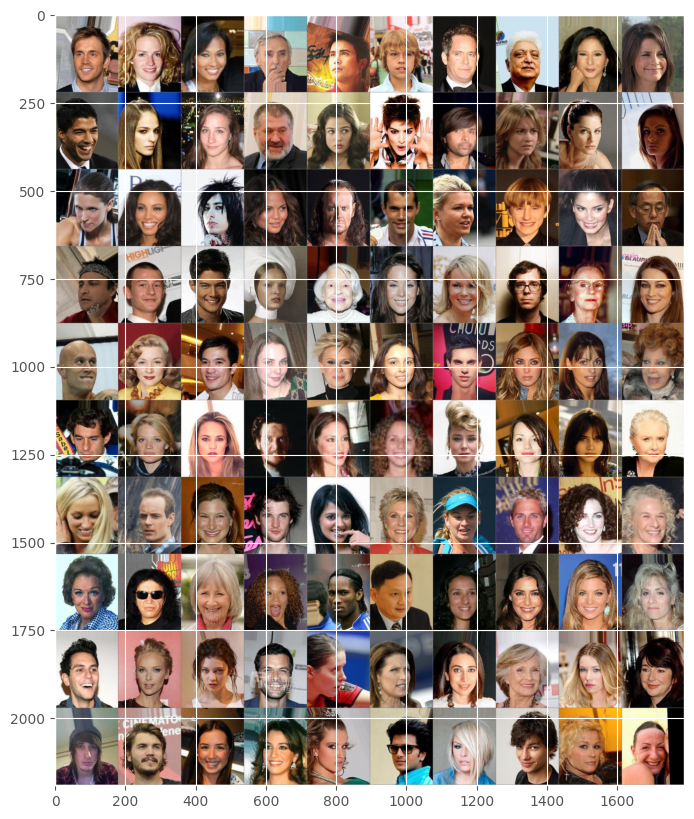

In [78]:
# Change the label to test different attributes
label='Bangs' #this is changed for mine!
has_label=True
n_imgs=100
label_i = net['labels'].index(label)
label_idxs = np.where(net['attributes'][:, label_i] == has_label)[0]
label_idxs = label_idxs[:n_imgs]
vgg_imgs = [plt.imread(files[img_i+1])/255.0
        for img_i in label_idxs]

# indices with true eyeglasses : 8, 34,
# indices with true hats : 6, 18, 23,
m = montage(vgg_imgs, 'test_bangs.png')
plt.figure(figsize=(10, 10))
plt.imshow(m)

In [79]:
#going to go through list_attr_celeba.txt
#infile = open("list_attr_celeba.txt","r")
from PIL import Image
def img_filter(label_idxs, dst='FacesWithBangs/', max_images=100):
    # Create a directory
    if not os.path.exists(dst):
        os.mkdir(dst)

    for ii in range(max_images):
        # create a string using the current loop counter
        older_dir = 'img_align_celeba/'
        try:
            f = '000%03d.jpg' % (label_idxs[ii]+1)
            image = Image.open(older_dir + f)

            image.save(dst + f)
        except:
            f = '00%03d.jpg' % (label_idxs[ii]+1)
            image = Image.open(older_dir + f)
            image.save(dst + f)

In [ ]:
### The eyeglasses dataset
# dirname = 'FacesWithGlasses/'
dirname = '/content/drive/MyDrive/Rice University/2023-2024/ELEC 576: Intro to Deep Learning/Final Project/faceswithBangs'
#dirname = './glasses/'
files = [os.path.join(dirname, fname)
             for fname in os.listdir(dirname)]

bangs_imgs = [plt.imread(files[img_i])
        for img_i in range(len(files))]

# Crop every image to a square
bangs_imgs = [imcrop_tosquare(img_i) for img_i in bangs_imgs]

# Then resize the square image to 100 x 100 pixels
bangs_imgs = [resize(img_i, (100, 100)) for img_i in bangs_imgs]

m = montage(bangs_imgs, 'FacesWithBangs.png')
plt.figure(figsize=(10, 10))
plt.imshow(m)

In [81]:
#tf.reset_default_graph()
sess = tf.Session()
g = tf.get_default_graph()
tf.import_graph_def(net['graph_def'], name='net', input_map={
    'encoder/variational/random_normal:0': np.zeros(512, dtype=np.float32)})

In [82]:
X = g.get_tensor_by_name('net/x:0')
Z = g.get_tensor_by_name('net/encoder/variational/z:0')
G = g.get_tensor_by_name('net/generator/x_tilde:0')

In [83]:
def get_features_for(feature_img_directory='./FacesWithBangs/', n_imgs=100):

    files = [os.path.join(feature_img_directory, fname)
             for fname in os.listdir(feature_img_directory)]

    files = files[:n_imgs]

    feature_imgs = [plt.imread(files[img_i])
        for img_i in range(len(files))]

    # Crop every image to a square
    feature_imgs = [imcrop_tosquare(img_i) for img_i in feature_imgs]

    # Then resize the square image to 100 x 100 pixels
    feature_imgs = [resize(img_i, (100, 100)) for img_i in feature_imgs]

    preprocessed = np.array([preprocess(img_i) for img_i in feature_imgs])
    zs = sess.run(Z, feed_dict={X: preprocessed})

    return np.mean(zs, 0)

In [84]:
z1 = get_features_for(feature_img_directory=dirname)


In [ ]:
print(z1[np.newaxis].shape)
feature_generated = sess.run(G, feed_dict={Z: z1[np.newaxis]})
plt.imshow(feature_generated[0] / feature_generated.max())

In [63]:
from scipy.ndimage import gaussian_filter

idxs = np.random.permutation(range(len(celeb_files)))
imgs = [plt.imread(celeb_files[idx_i]) for idx_i in idxs[:100]]
blurred = []
for img_i in imgs:
    img_copy = np.zeros_like(img_i)
    for ch_i in range(3):
        img_copy[..., ch_i] = gaussian_filter(img_i[..., ch_i], sigma=3.0)
    blurred.append(img_copy)
imgs_p = np.array([preprocess(img_i) for img_i in imgs])
blur_p = np.array([preprocess(img_i) for img_i in blurred])

noblur = sess.run(Z, feed_dict={X: imgs_p})
blur = sess.run(Z, feed_dict={X: blur_p})

synthetic_unblur_vector = np.mean(noblur - blur, 0)

In [64]:
# Let's randomly choose a set of 100 faces on the Celeb dataset and try apply the effect of the glass_vector on.


idxs = np.random.permutation(range(len(celeb_files)))
imgs = [plt.imread(celeb_files[idx_i]) for idx_i in idxs[:100]]

imgs_p = np.array([preprocess(img_i) for img_i in imgs])

print("size celeb_files : ", len(celeb_files))

z = sess.run(Z, feed_dict={X: imgs_p})

n_imgs = 5
amt = np.linspace(0, 1, n_imgs)
imgs = []
for amt_i in amt:
    zs = z + synthetic_unblur_vector * amt_i + amt_i * glass_vector + amt_i * glass_vector
    g = sess.run(G, feed_dict={Z: zs})
    m = montage(np.clip(g, 0, 1))
    imgs.append(m)



size celeb_files :  202599


In [ ]:
build_gif(imgs=imgs, saveto='final_project_bangs.gif')

# mustache

In [66]:
files = CELEB()

celeb_files = files.copy()

In [67]:
dirname = '/content/drive/MyDrive/Rice University/2023-2024/ELEC 576: Intro to Deep Learning/Final Project/FacesWithMustache'


In [68]:
from PIL import Image
def img_filter(label_idxs, dst=dirname, max_images=100):
    # Create a directory
    if not os.path.exists(dst):
        os.mkdir(dst)

    for ii in range(max_images):
        # create a string using the current loop counter
        older_dir = 'img_align_celeba/'
        try:
            f = '000%03d.jpg' % (label_idxs[ii]+1)
            image = Image.open(older_dir + f)

            image.save(dst + f)
        except:
            f = '00%03d.jpg' % (label_idxs[ii]+1)
            image = Image.open(older_dir + f)
            image.save(dst + f)

In [ ]:
# Change the label to test different attributes
label='Mustache'
has_label=True
n_imgs=100
label_i = net['labels'].index(label)
label_idxs = np.where(net['attributes'][:, label_i] == has_label)[0]
label_idxs = label_idxs[:n_imgs]
print(label_idxs)
vgg_imgs = [plt.imread(files[img_i])/255.0
        for img_i in label_idxs]

# indices with true eyeglasses : 8, 34,
# indices with true hats : 6, 18, 23,
m = montage(vgg_imgs, 'test_mustache.png')
plt.figure(figsize=(10, 10))
plt.imshow(m)

img_filter(label_idxs, dst='FacesWithMustache/', max_images=100)

In [ ]:
### The Mustache dataset


files = [os.path.join(dirname, fname)
             for fname in os.listdir(dirname)]

mustache_imgs = [plt.imread(files[img_i])
        for img_i in range(len(files))]

# Crop every image to a square
mustache_imgs = [imcrop_tosquare(img_i) for img_i in mustache_imgs]

# Then resize the square image to 100 x 100 pixels
mustache_imgs = [resize(img_i, (100, 100)) for img_i in mustache_imgs]

m = montage(mustache_imgs, dirname + '/FacesWithMustache.png')
plt.figure(figsize=(10, 10))
plt.imshow(m)

In [72]:
#tf.reset_default_graph()
sess = tf.Session()
g = tf.get_default_graph()
tf.import_graph_def(net['graph_def'], name='net', input_map={
    'encoder/variational/random_normal:0': np.zeros(512, dtype=np.float32)})

In [73]:
X = g.get_tensor_by_name('net/x:0')
Z = g.get_tensor_by_name('net/encoder/variational/z:0')
G = g.get_tensor_by_name('net/generator/x_tilde:0')

In [74]:
def get_features_for(feature_img_directory=dirname, n_imgs=100):

    files = [os.path.join(feature_img_directory, fname)
             for fname in os.listdir(feature_img_directory)]

    files = files[:n_imgs]

    feature_imgs = [plt.imread(files[img_i])
        for img_i in range(len(files))]

    # Crop every image to a square
    feature_imgs = [imcrop_tosquare(img_i) for img_i in feature_imgs]

    # Then resize the square image to 100 x 100 pixels
    feature_imgs = [resize(img_i, (100, 100)) for img_i in feature_imgs]

    preprocessed = np.array([preprocess(img_i) for img_i in feature_imgs])
    zs = sess.run(Z, feed_dict={X: preprocessed})

    return np.mean(zs, 0)

In [75]:
z1 = get_features_for(feature_img_directory=dirname)


In [76]:
from scipy.ndimage import gaussian_filter

idxs = np.random.permutation(range(len(celeb_files)))
imgs = [plt.imread(celeb_files[idx_i]) for idx_i in idxs[:100]]
blurred = []
for img_i in imgs:
    img_copy = np.zeros_like(img_i)
    for ch_i in range(3):
        img_copy[..., ch_i] = gaussian_filter(img_i[..., ch_i], sigma=3.0)
    blurred.append(img_copy)
imgs_p = np.array([preprocess(img_i) for img_i in imgs])
blur_p = np.array([preprocess(img_i) for img_i in blurred])

noblur = sess.run(Z, feed_dict={X: imgs_p})
blur = sess.run(Z, feed_dict={X: blur_p})

synthetic_unblur_vector = np.mean(noblur - blur, 0)